# **Imports**

In [ ]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [ ]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization

# Callbacks
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

# **Data**

In [ ]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]

    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))

    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img

    return images

In [ ]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [ ]:
SIZE = 256

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
root_path = '/content/drive/My Drive/Dataset_BUSI_with_GT/'
classes = sorted(os.listdir(root_path))
classes

['benign', 'malignant', 'normal']

In [ ]:
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])

In [ ]:
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

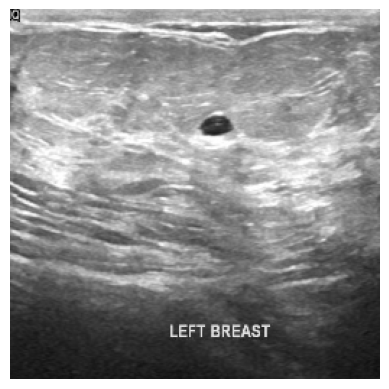

In [ ]:
show_image(load_image(image_paths[0], SIZE))

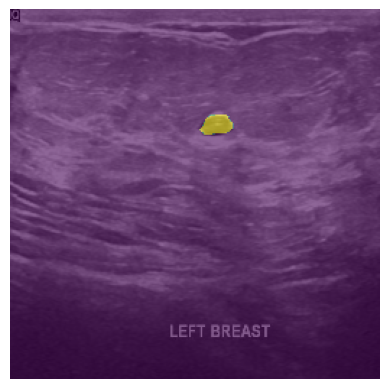

In [ ]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

## **Approach**

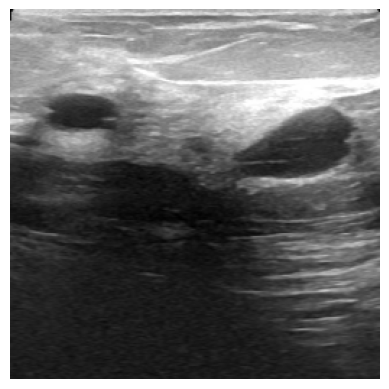

In [ ]:
show_image(load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))

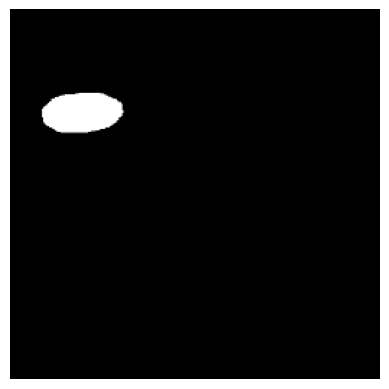

In [ ]:
show_image(load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE))

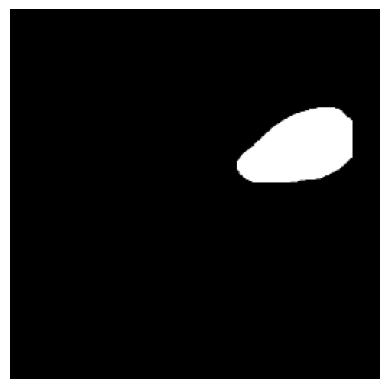

In [ ]:
show_image(load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE))

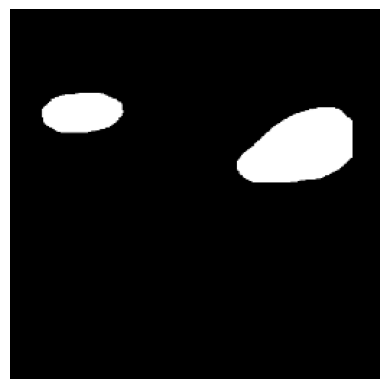

In [ ]:
img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE)
mask2 = load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE)

img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='gray')

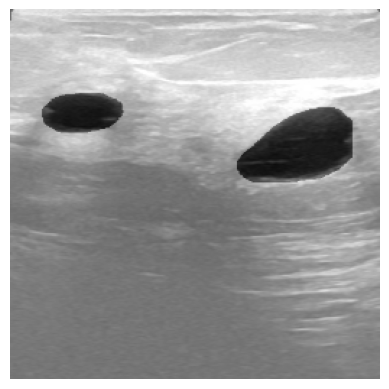

In [ ]:
show_image(load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='binary', alpha=0.4)
plt.axis('off')
plt.show()

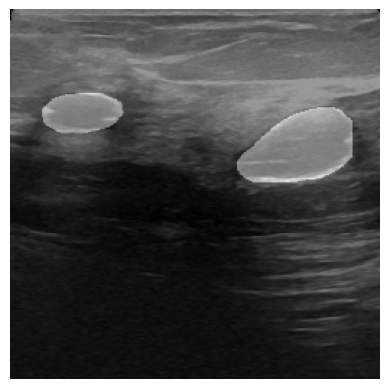

In [ ]:
show_image(load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

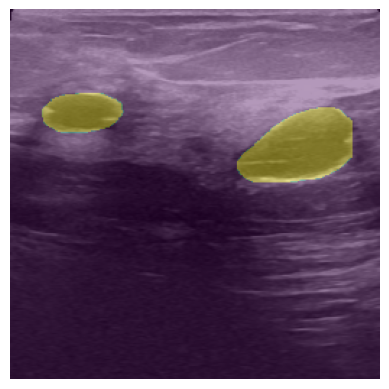

In [ ]:
show_image(load_image('/content/drive/My Drive/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

## **Data Work**

In [ ]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

In [ ]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

NameError: name 'plt' is not defined

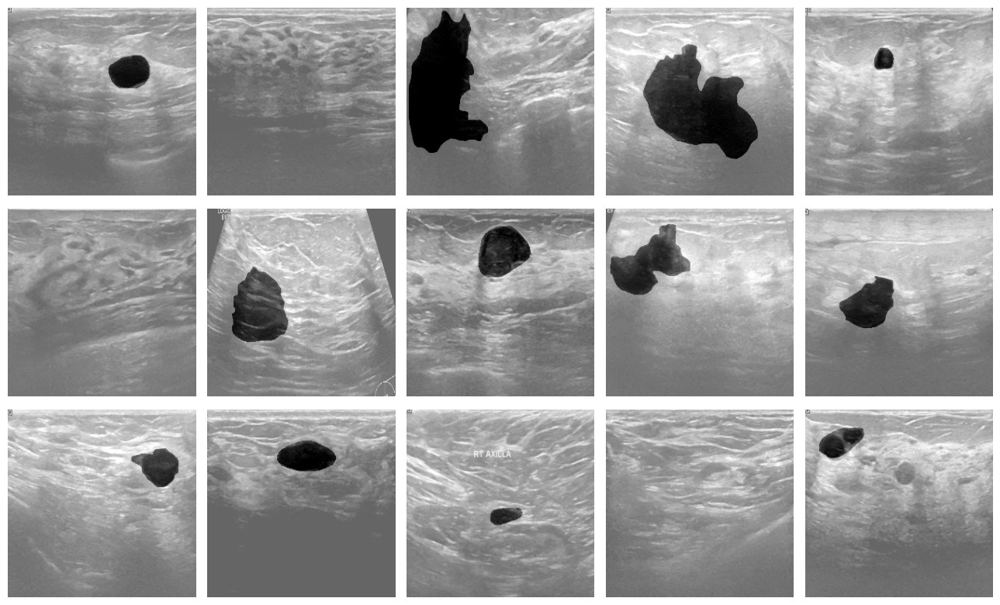

In [ ]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

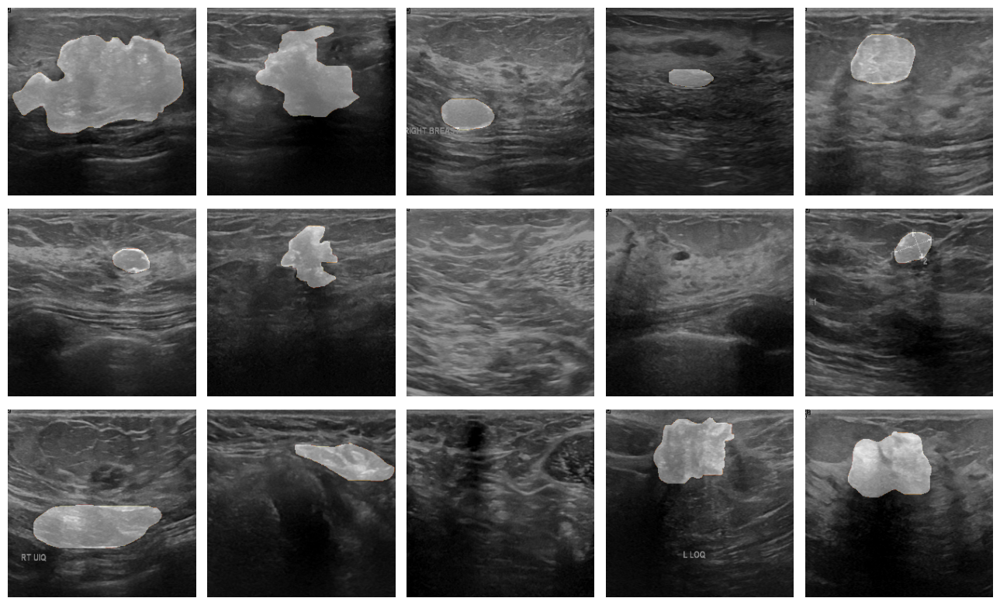

In [ ]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

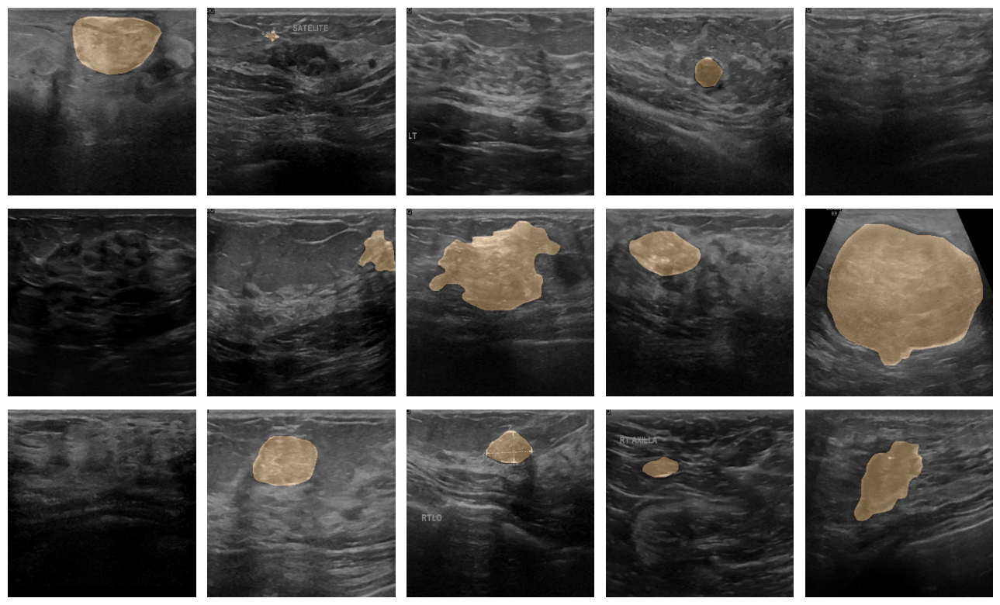

In [ ]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

# **Encoder**

In [ ]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

# **Decoder**

In [ ]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

# **Attention Gate**

In [ ]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

# **Custom Callback**

In [ ]:

class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()

        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis, ...])

        # Convert pred_mask to NumPy array to avoid issues
        pred_mask = np.array(pred_mask, dtype=np.float32)

        # Ensure Grad-CAM gets a valid model
        gradcam_model = Model(self.model.input, self.model.outputs[0])  # Extract output tensor

        cam = exp.explain(
            validation_data=(image[np.newaxis, ...], mask),
            class_index=1,  # or 0, depending on your class indexing
            layer_name='Attention4',
            model=gradcam_model  # Use modified model
        )

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 3, 1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1, 3, 2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1, 3, 3)
        show_image(cam, title="GradCAM")

        plt.tight_layout()
        plt.show()



# **Attention UNet**

In [ ]:
# Inputs
input_layer = Input(shape=images.shape[-3:])


# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]

NameError: name 'images' is not defined

# **Training**

In [ ]:
print(model.output)


[<KerasTensor shape=(None, 256, 256, 1), dtype=float32, sparse=False, name=keras_tensor_119>]


In [ ]:
print(type(model.output))
print(model.output)


<class 'list'>
[<KerasTensor shape=(None, 256, 256, 1), dtype=float32, sparse=False, name=keras_tensor_119>]


Epoch 1/15


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_80']
Received: inputs=Tensor(shape=(8, 256, 256, 3))
  warnings.warn(msg)


78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - IoU: 0.4518 - accuracy: 0.8723 - loss: 5.8868

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_80']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_80']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_80']]
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


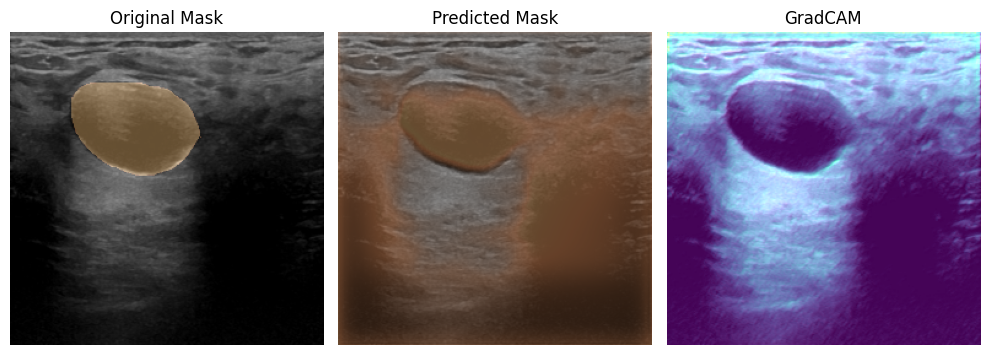

78/78 ━━━━━━━━━━━━━━━━━━━━ 56s 368ms/step - IoU: 0.4518 - accuracy: 0.8726 - loss: 5.8339 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.2780
Epoch 2/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - IoU: 0.4549 - accuracy: 0.9089 - loss: 0.2541

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


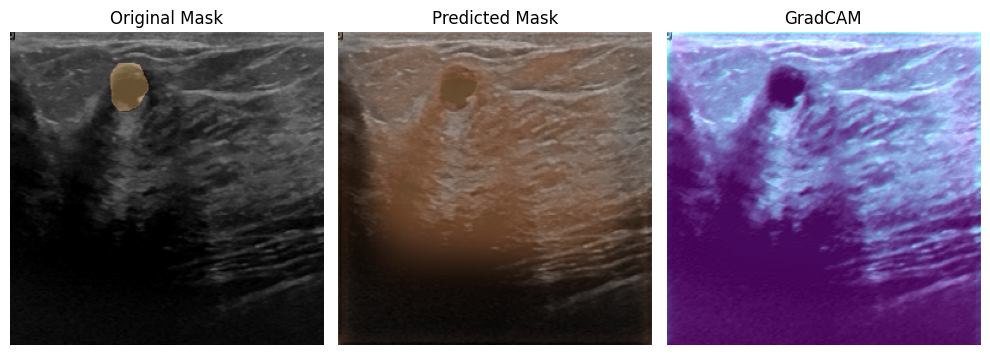

78/78 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - IoU: 0.4549 - accuracy: 0.9089 - loss: 0.2540 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.2460
Epoch 3/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - IoU: 0.4589 - accuracy: 0.9221 - loss: 0.2062

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


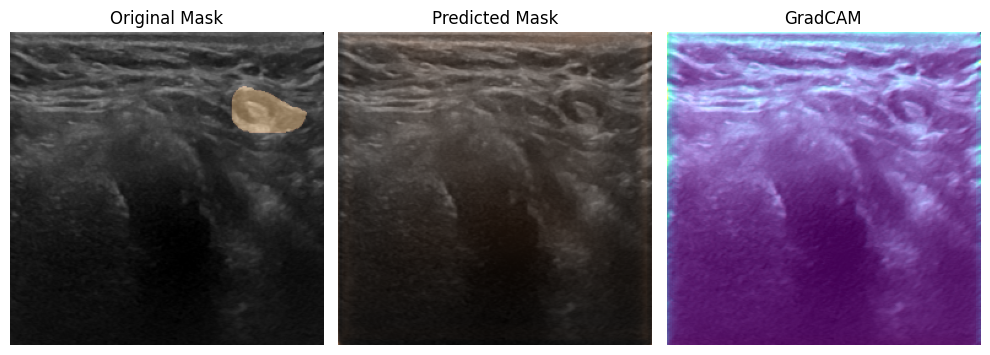

78/78 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - IoU: 0.4588 - accuracy: 0.9220 - loss: 0.2064 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.0916
Epoch 4/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


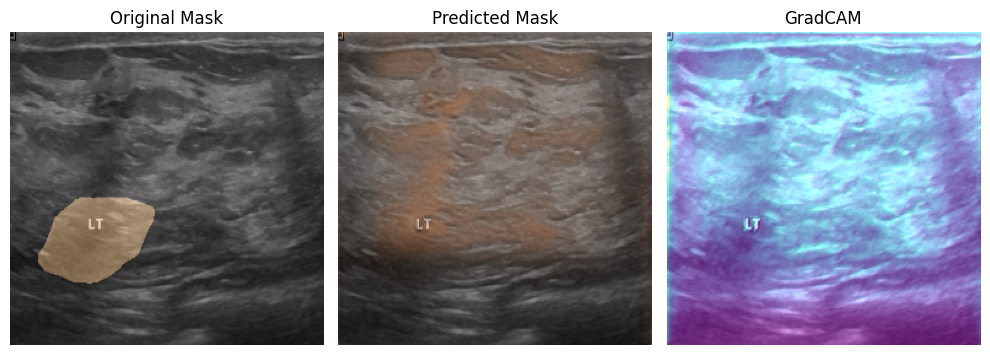

78/78 ━━━━━━━━━━━━━━━━━━━━ 20s 234ms/step - IoU: 0.4512 - accuracy: 0.9149 - loss: 0.2232 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.0977
Epoch 5/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


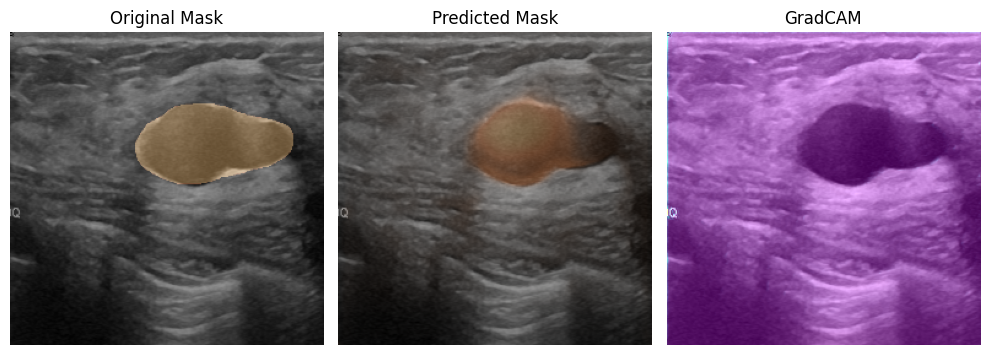

78/78 ━━━━━━━━━━━━━━━━━━━━ 18s 232ms/step - IoU: 0.4545 - accuracy: 0.9226 - loss: 0.2048 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.0917
Epoch 6/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


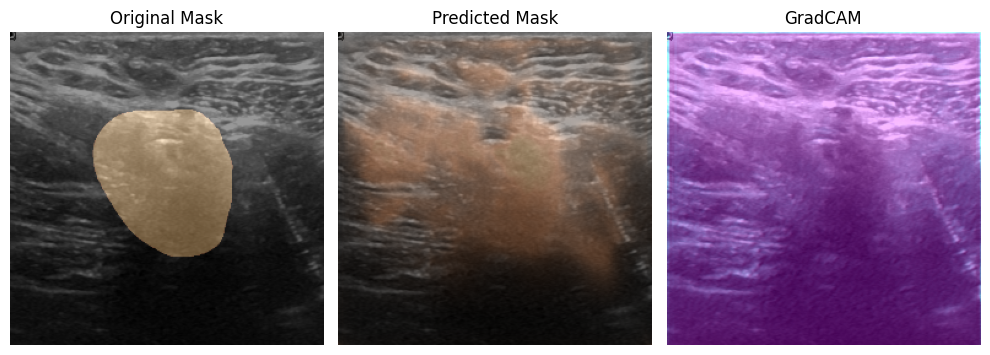

78/78 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - IoU: 0.4531 - accuracy: 0.9240 - loss: 0.2035 - val_IoU: 0.4909 - val_accuracy: 0.9430 - val_loss: 0.2517
Epoch 7/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


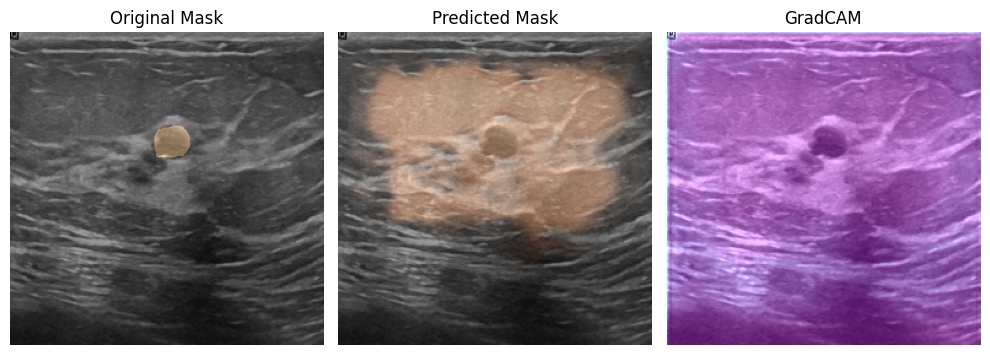

78/78 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - IoU: 0.4544 - accuracy: 0.9241 - loss: 0.1990 - val_IoU: 0.4909 - val_accuracy: 0.8617 - val_loss: 0.2378
Epoch 8/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


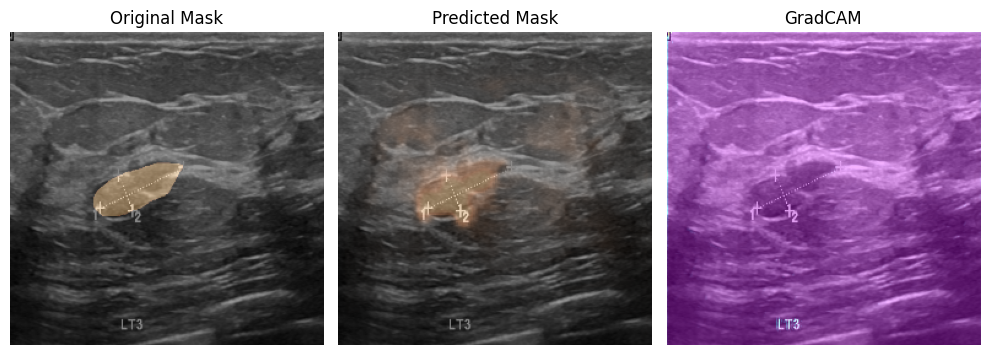

78/78 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - IoU: 0.4565 - accuracy: 0.9360 - loss: 0.1773 - val_IoU: 0.4909 - val_accuracy: 0.9727 - val_loss: 0.1095
Epoch 9/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - IoU: 0.4563 - accuracy: 0.9373 - loss: 0.1675

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


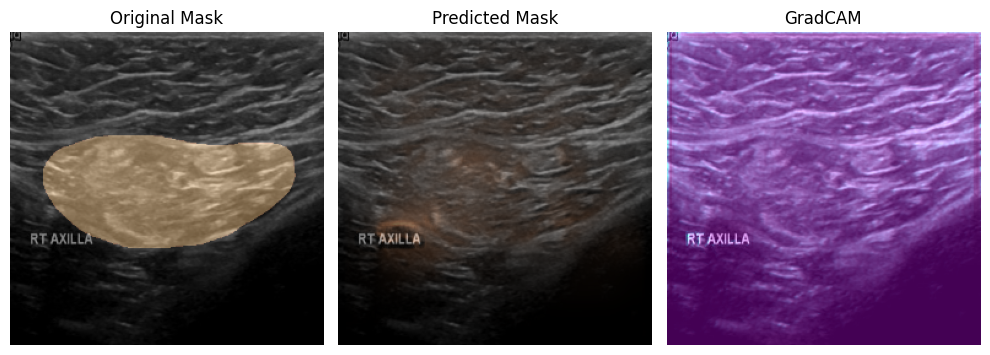

78/78 ━━━━━━━━━━━━━━━━━━━━ 18s 236ms/step - IoU: 0.4563 - accuracy: 0.9373 - loss: 0.1676 - val_IoU: 0.4909 - val_accuracy: 0.9842 - val_loss: 0.0757
Epoch 10/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


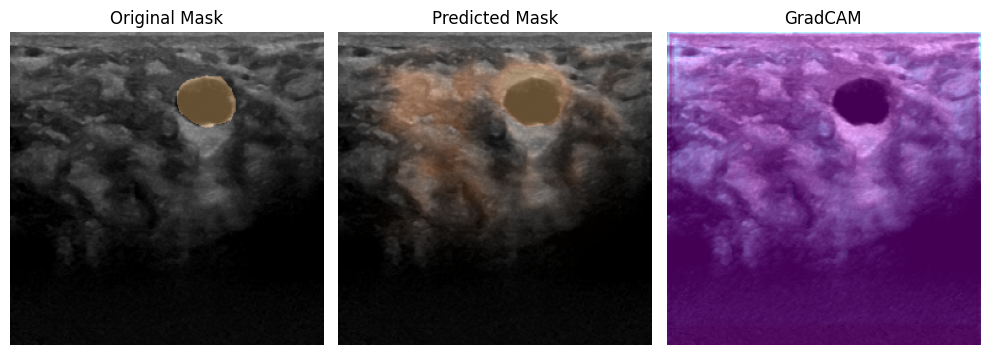

78/78 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - IoU: 0.4529 - accuracy: 0.9341 - loss: 0.1787 - val_IoU: 0.4909 - val_accuracy: 0.9458 - val_loss: 0.1516
Epoch 11/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - IoU: 0.4576 - accuracy: 0.9464 - loss: 0.1514

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


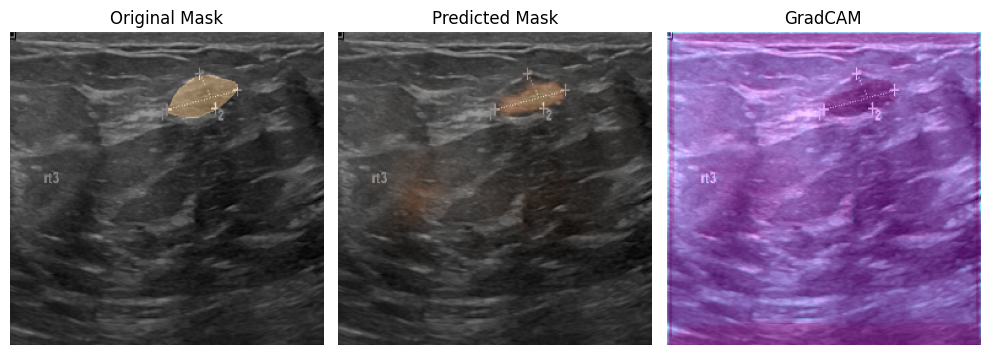

78/78 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - IoU: 0.4576 - accuracy: 0.9463 - loss: 0.1515 - val_IoU: 0.4909 - val_accuracy: 0.9834 - val_loss: 0.0669
Epoch 12/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - IoU: 0.4541 - accuracy: 0.9439 - loss: 0.1564

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


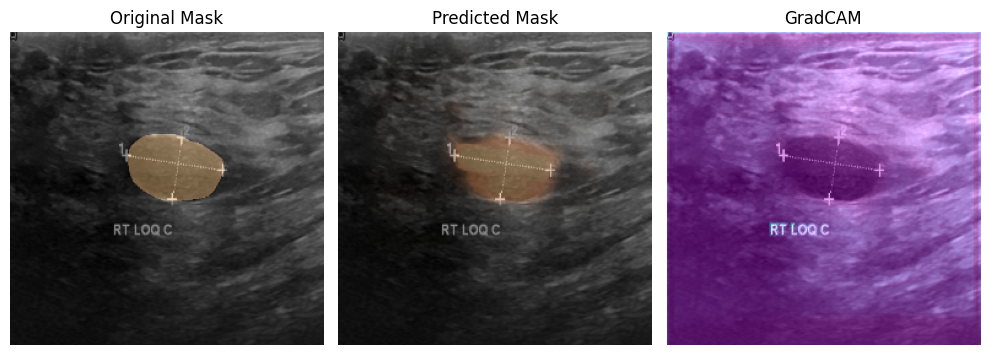

78/78 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - IoU: 0.4541 - accuracy: 0.9439 - loss: 0.1564 - val_IoU: 0.4909 - val_accuracy: 0.9828 - val_loss: 0.0613
Epoch 13/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


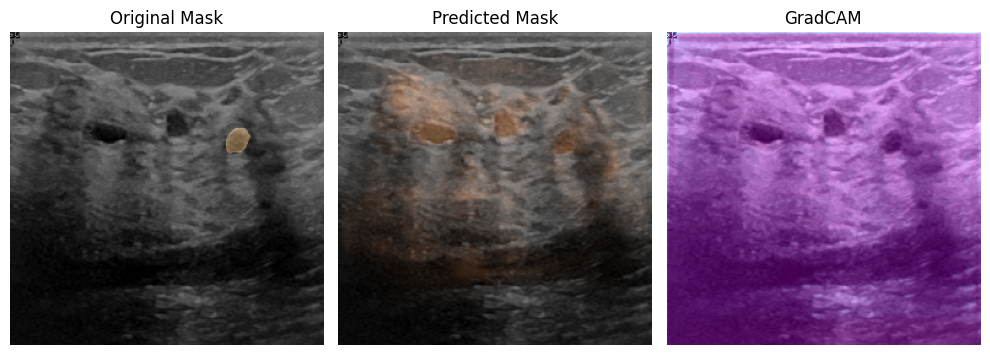

78/78 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - IoU: 0.4589 - accuracy: 0.9463 - loss: 0.1487 - val_IoU: 0.4909 - val_accuracy: 0.9497 - val_loss: 0.1352
Epoch 14/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - IoU: 0.4549 - accuracy: 0.9461 - loss: 0.1470

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


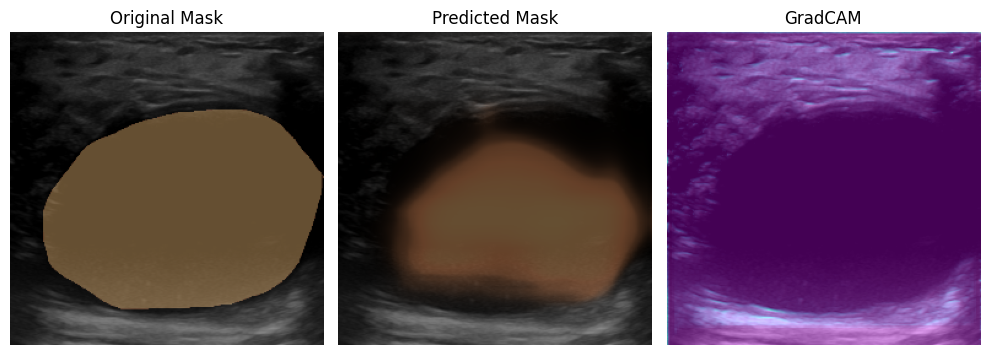

78/78 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - IoU: 0.4549 - accuracy: 0.9461 - loss: 0.1470 - val_IoU: 0.4909 - val_accuracy: 0.9849 - val_loss: 0.0574
Epoch 15/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


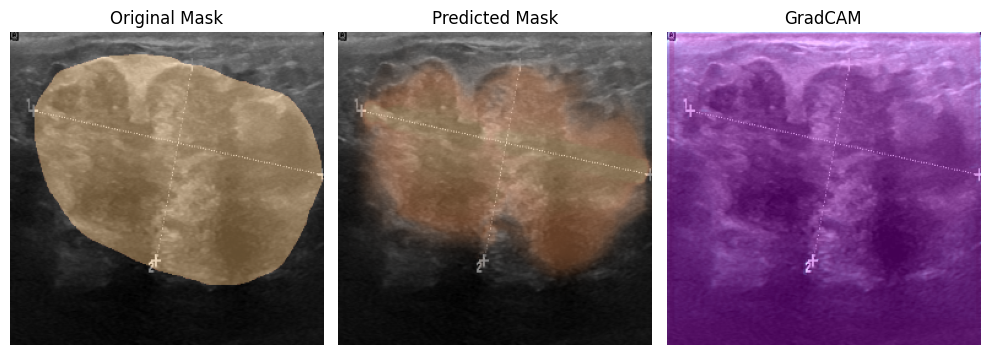

78/78 ━━━━━━━━━━━━━━━━━━━━ 18s 231ms/step - IoU: 0.4576 - accuracy: 0.9461 - loss: 0.1491 - val_IoU: 0.4909 - val_accuracy: 0.9805 - val_loss: 0.0751


In [ ]:

BATCH_SIZE = 8

results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=15,
    batch_size=BATCH_SIZE,
    callbacks=cb
)


In [ ]:
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Encoder1 (EncoderBlock)   │ [(None, 128, 128, 32), │         10,144 │ input_layer_2[0][0]    │
│                           │ (None, 256, 256, 32)]  │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Encoder2 (EncoderBlock)   │ [(None, 64, 64, 64),   │         55,424 │ Encoder1[0][0]         │
│                           │ (None, 128, 128, 64)]  │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Encoder3 (EncoderBlock)   │ [(None, 32, 32, 128),  │        221,440 │ Encoder2[0][0]         │
│                           │ (None, 64, 64, 128)]   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Encoder4 (EncoderBlock)   │ [(None, 16, 16, 256),  │        885,248 │ Encoder3[0][0]         │
│                           │ (None, 32, 32, 256)]   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Encoding (EncoderBlock)   │ (None, 16, 16, 512)    │      3,539,968 │ Encoder4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Attention1                │ (None, 32, 32, 256)    │      1,771,265 │ Encoding[0][0],        │
│ (AttentionGate)           │                        │                │ Encoder4[0][1]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Decoder1 (DecoderBlock)   │ (None, 32, 32, 256)    │      2,359,808 │ Encoding[0][0],        │
│                           │                        │                │ Attention1[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Attention2                │ (None, 64, 64, 128)    │        443,265 │ Decoder1[0][0],        │
│ (AttentionGate)           │                        │                │ Encoder3[0][1]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Decoder2 (DecoderBlock)   │ (None, 64, 64, 128)    │        590,080 │ Decoder1[0][0],        │
│                           │                        │                │ Attention2[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Attention3                │ (None, 128, 128, 64)   │        111,041 │ Decoder2[0][0],        │
│ (AttentionGate)           │                        │                │ Encoder2[0][1]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Decoder3 (DecoderBlock)   │ (None, 128, 128, 64)   │        147,584 │ Decoder2[0][0],        │
│                           │                        │                │ Attention3[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Attention4                │ (None, 256, 256, 32)   │         27,873 │ Decoder3[0][0],        │
│ (AttentionGate)           │                        │                │ Encoder1[0][1]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Decoder4 (DecoderBloc

 Total params: 30,598,385 (116.72 MB)

 Trainable params: 10,199,141 (38.91 MB)

 Non-trainable params: 960 (3.75 KB)

 Optimizer params: 20,398,284 (77.81 MB)

# **Evaluation**

In [ ]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

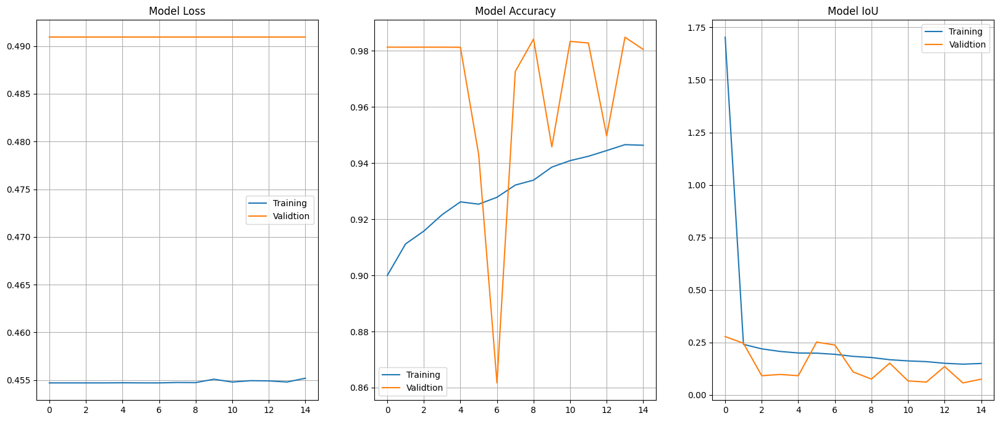

In [ ]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


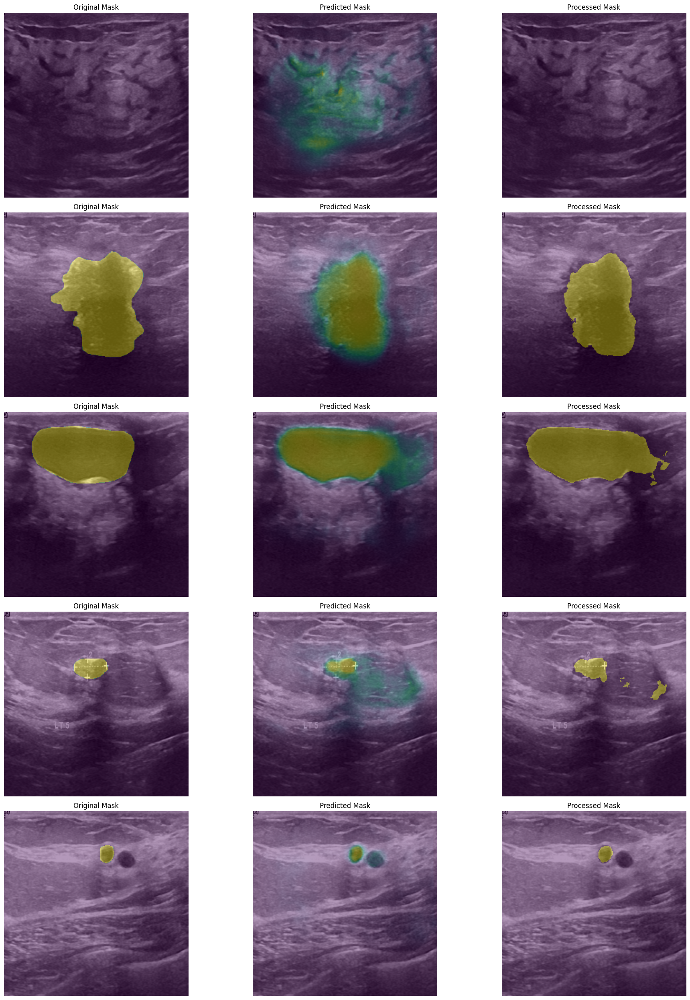

In [ ]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

In [ ]:
model.save('/content/drive/My Drive/tumor_segmentation_model.h5')


In [ ]:
from tensorflow.keras.models import load_model

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the model
model_path = "/content/drive/My Drive/tumor_segmentation_model.h5"
model = load_model('/content/drive/My Drive/tumor_segmentation_model.h5',custom_objects={'EncoderBlock': EncoderBlock,'DecoderBlock': DecoderBlock,
                       'AttentionGate': AttentionGate})


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


✅ Model loaded successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


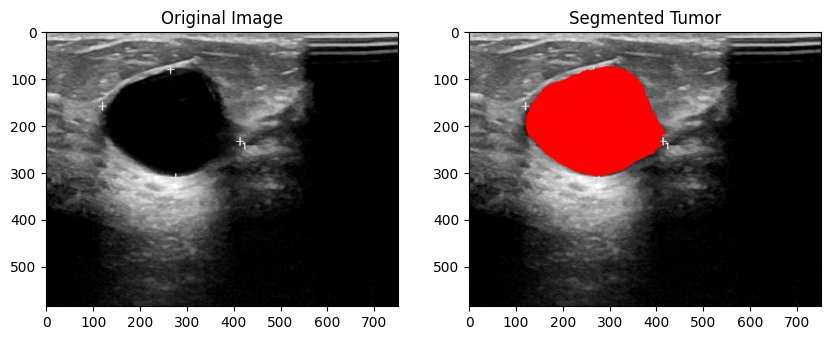

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model


print("✅ Model loaded successfully!")


def segment_tumor(image_path):
    input_size = (256, 256)

    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    original_size = (image.shape[1], image.shape[0])  # Save original size for resizing output

    # Resize and normalize
    image_resized = cv2.resize(image, input_size)
    image_array = np.expand_dims(image_resized, axis=0) / 255.0

    # Model prediction
    prediction = model.predict(image_array)[0]
    mask_resized = cv2.resize(prediction, original_size)  # Resize to original image size
    mask_binary = (mask_resized > 0.5).astype(np.uint8) * 255  # Convert to binary mask

    # Overlay tumor region in red
    overlay = image.copy()
    overlay[mask_binary == 255] = [255, 0, 0]

    # Display results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Segmented Tumor")

    plt.show()


image_path = "/content/benign (9).png"
segment_tumor(image_path)



exai ignore

In [ ]:
pip install shap


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


root_path = "/content/drive/My Drive/Dataset_BUSI_with_GT/"

classes = ["benign", "malignant", "normal"]

image_paths = []
mask_paths = []

image_mask_dict = {}

for category in classes:
    class_path = os.path.join(root_path, category)

    for file in os.listdir(class_path):
        file_path = os.path.join(class_path, file)

        if "mask" in file.lower():
            mask_paths.append(file_path)
        else:
            image_paths.append(file_path)

            base_name = file.split('.')[0]
            image_mask_dict[base_name] = file_path


paired_images = []
paired_masks = []

for mask_path in mask_paths:
    mask_name = os.path.basename(mask_path)
    base_name = mask_name.replace("_mask", "").split('.')[0]

    if base_name in image_mask_dict:
        paired_images.append(image_mask_dict[base_name])
        paired_masks.append(mask_path)


IMG_SIZE = (256, 256)

def load_images(paths, size=(256, 256), mask=False):
    images = []
    for path in paths:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE if mask else cv2.IMREAD_COLOR)
        img = cv2.resize(img, size)
        img = img / 255.0
        images.append(img)
    return np.array(images)


images = load_images(paired_images, IMG_SIZE)
masks = load_images(paired_masks, IMG_SIZE, mask=True)
masks = masks[..., np.newaxis]

print(f"Loaded {len(images)} images and {len(masks)} masks.")



KeyboardInterrupt: 

Classification

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt

DATASET_PATH = '/content/drive/My Drive/Dataset_BUSI_with_GT/'

# Filter images
def filter_images(files):
    return [f for f in files if 'mask' not in f.lower()]

categories = ['benign', 'malignant', 'normal']
image_paths, labels = [], []

for idx, category in enumerate(categories):
    category_path = os.path.join(DATASET_PATH, category)
    files = filter_images(os.listdir(category_path))
    for file in files:
        image_paths.append(os.path.join(category_path, file))
        labels.append(idx)

image_paths = np.array(image_paths)
labels = np.array(labels)


In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import load_img, img_to_array

IMG_SIZE = (224, 224)

def load_images(image_paths):
    images = [img_to_array(load_img(img, target_size=IMG_SIZE)) / 255.0 for img in image_paths]
    return np.array(images)

X_train, X_val, y_train, y_val = train_test_split(image_paths, labels, test_size=0.2, stratify=labels, random_state=42)

X_train = load_images(X_train)
X_val = load_images(X_val)

y_train = tf.keras.utils.to_categorical(y_train, num_classes=3)
y_val = tf.keras.utils.to_categorical(y_val, num_classes=3)

# Data Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau


base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Unfreeze last few layers for fine-tuning
for layer in base_model.layers[-30:]:
    layer.trainable = True

# Custom Layers
x = GlobalAveragePooling2D()(base_model.output)
x = BatchNormalization()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.4)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
output_layer = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output_layer)

model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1
)

model.summary()




Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_6 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_3           │ (None, 224, 224, 3)    │              7 │ rescaling_6[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_7 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_7[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 40)   │          1,080 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 40)   │            160 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 40)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 40)   │            360 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 40)   │            160 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 40)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 40)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 40)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 10)       │            410 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 11,216,434 (42.79 MB)

 Trainable params: 11,126,059 (42.44 MB)

 Non-trainable params: 90,375 (353.03 KB)

In [ ]:
# Compute Class Weights
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(labels), y=labels)
class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}
print("Class Weights:", class_weights_dict)


Class Weights: {0: np.float64(0.5949656750572082), 1: np.float64(1.2380952380952381), 2: np.float64(1.9548872180451127)}


In [ ]:
# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6)
]

history = model.fit(
    train_datagen.flow(X_train, y_train, batch_size=16),
    validation_data=(X_val, y_val),
    epochs=30,
    class_weight=class_weights_dict,
    callbacks=callbacks
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 160s 891ms/step - accuracy: 0.4605 - loss: 1.5204 - val_accuracy: 0.5577 - val_loss: 1.0626 - learning_rate: 0.0010
Epoch 2/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 237ms/step - accuracy: 0.6590 - loss: 0.9145 - val_accuracy: 0.1731 - val_loss: 1.6147 - learning_rate: 0.0010
Epoch 3/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - accuracy: 0.6053 - loss: 1.0453 - val_accuracy: 0.5577 - val_loss: 1.0518 - learning_rate: 0.0010
Epoch 4/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 275ms/step - accuracy: 0.6486 - loss: 0.9504 - val_accuracy: 0.1731 - val_loss: 1.2056 - learning_rate: 0.0010
Epoch 5/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 230ms/step - accuracy: 0.7432 - loss: 0.6833 - val_accuracy: 0.5577 - val_loss: 1.0494 - learning_rate: 0.0010
Epoch 6/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 255ms/step - accuracy: 0.7803 - loss: 0.6848 - val_accuracy: 0.5577 - val_loss: 1.0443 - learning_rate: 0.0010
Epoch 7/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - accuracy: 0.7553 - loss: 0.

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - accuracy: 0.8398 - loss: 0.4434
Validation Accuracy: 84.62%


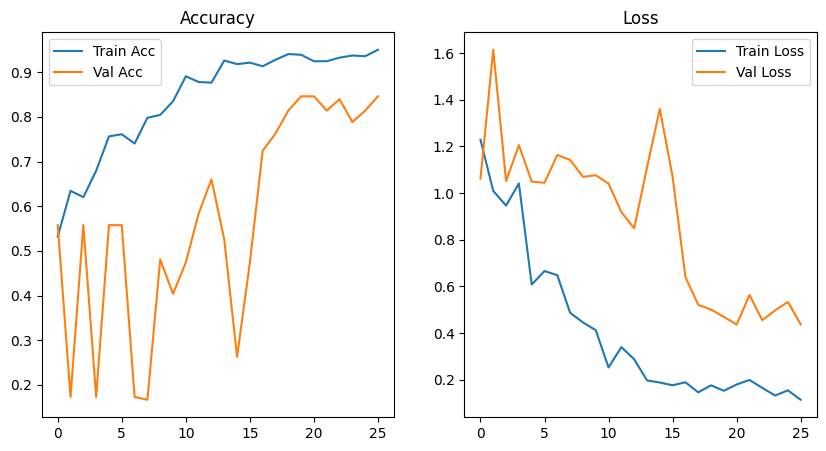

In [ ]:

val_loss, val_acc = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {val_acc*100:.2f}%")

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.legend()
plt.title("Accuracy")

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.legend()
plt.title("Loss")

plt.show()


In [ ]:
# Predict on Images
def predict_image(image_path):
    img = load_img(image_path, target_size=IMG_SIZE)
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array)
    class_idx = np.argmax(prediction)
    class_labels = {0: 'Benign', 1: 'Malignant', 2: 'Normal'}

    return class_labels[class_idx], prediction


image_path = "/content/benign (90).png"
label, confidence = predict_image(image_path)
print(f"Prediction: {label}, Confidence: {confidence}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Prediction: Benign, Confidence: [[0.9949595  0.00396908 0.00107139]]


In [ ]:
model.save("/content/drive/MyDrive/efficientnet_model.h5")


In [ ]:
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4%}")



5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8398 - loss: 0.4434
Validation Loss: 0.4361
Validation Accuracy: 84.6154%


In [ ]:
history_dict = history.history

print("Available Metrics:", history_dict.keys())
print(f"Final Training Accuracy: {history_dict['accuracy'][-1]:.4%}")
print(f"Final Validation Accuracy: {history_dict['val_accuracy'][-1]:.4%}")
print(f"Final Training Loss: {history_dict['loss'][-1]:.4f}")
print(f"Final Validation Loss: {history_dict['val_loss'][-1]:.4f}")



Available Metrics: dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss', 'learning_rate'])
Final Training Accuracy: 95.0321%
Final Validation Accuracy: 84.6154%
Final Training Loss: 0.1136
Final Validation Loss: 0.4372


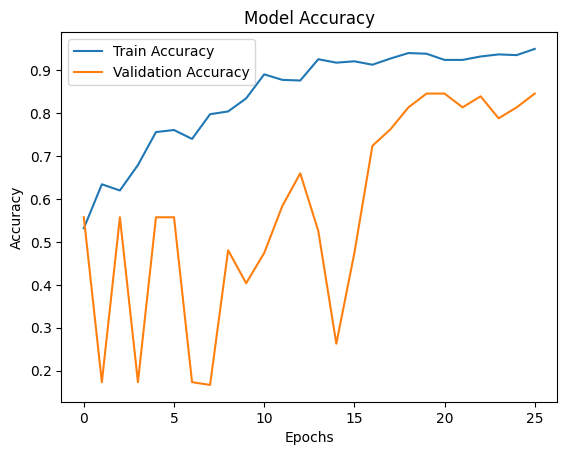

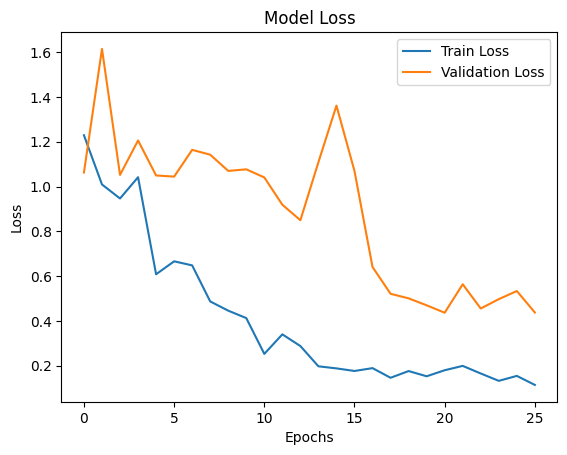

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Model Loss')
plt.show()
